In [1]:
import json
import requests
import os
import zipfile
import geopandas as gpd 
import pandas as pd
import contextily as cx
import numpy as np
import io
from pandas import json_normalize
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

# CLUSTERING POR RESTAURANTES

El objetivo principal de este proyecto es lograr dar recomendaciones de posibles ubicaciones para abrir restaurantes de cierto giro.
El primer para conseguir esto es usar DBSCAN para agrupar los AGEBs en clusters, utilizando datos de frecuencia de restaurantes. Estos clusters serviránpara identificar patrones y similitudes entre diferentes áreas en términos de la disponibilidad y variedad de restaurantes.

In [2]:
#leemos el archicvo shape de los agebs de Nuevo León
gdf = gpd.read_file("DF_FINAL1.shp").to_crs(4326)

In [124]:
gdf.shape

(1287, 28)

In [3]:
gdf.head()

,CVEMA,MUN,NOM_MUN,AGEB,P12A14NOA,P15YM_AN,P18YM_PB,P6A11_NOAM,POBTOT,PSINDER,...,VPH_REFRI,VPH_TELEF,Restaurant,Restaura_1,Restaura_2,Restaura_3,Restaura_4,Restaura_5,Restaura_6,geometry
0,0061882,6,Apodaca,1882,10,67,3404,0,10712,2186,...,2786,1874,0,2,0,3,3,1,3,"POLYGON ((-100.15091 25.71505, -100.15099 25.7..."
1,0061435,6,Apodaca,1435,5,16,4582,4,9224,1185,...,2538,1712,0,0,0,1,1,3,0,"POLYGON ((-100.16946 25.75323, -100.16861 25.7..."
2,0061647,6,Apodaca,1647,3,6,2822,0,4650,638,...,1404,1128,0,0,0,2,1,0,0,"POLYGON ((-100.23345 25.77729, -100.23349 25.7..."
3,0060969,6,Apodaca,0969,0,0,0,0,0,0,...,0,0,8,2,1,3,3,6,0,"POLYGON ((-100.18562 25.77552, -100.18542 25.7..."
4,006030A,6,Apodaca,030A,10,15,2860,7,8268,1230,...,2168,1343,0,1,0,1,0,0,0,"POLYGON ((-100.16562 25.73954, -100.16554 25.7..."


In [4]:
nuevos_nombres = {'Restaurant': 'Rest_Carta',
                  'Restaura_1': 'Rest_Antojitos',
                  'Restaura_2': 'Rest_Mariscos',
                  'Restaura_3': 'Rest_Rapida',
                  'Restaura_4': 'Rest_TacosTortas',
                  'Restaura_5': 'Rest_Autoserv',
                  'Restaura_6': 'Rest_OtrosLlevar',
                  }

gdf.rename(columns=nuevos_nombres, inplace=True)
gdf.head()


,CVEMA,MUN,NOM_MUN,AGEB,P12A14NOA,P15YM_AN,P18YM_PB,P6A11_NOAM,POBTOT,PSINDER,...,VPH_REFRI,VPH_TELEF,Rest_Carta,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar,geometry
0,0061882,6,Apodaca,1882,10,67,3404,0,10712,2186,...,2786,1874,0,2,0,3,3,1,3,"POLYGON ((-100.15091 25.71505, -100.15099 25.7..."
1,0061435,6,Apodaca,1435,5,16,4582,4,9224,1185,...,2538,1712,0,0,0,1,1,3,0,"POLYGON ((-100.16946 25.75323, -100.16861 25.7..."
2,0061647,6,Apodaca,1647,3,6,2822,0,4650,638,...,1404,1128,0,0,0,2,1,0,0,"POLYGON ((-100.23345 25.77729, -100.23349 25.7..."
3,0060969,6,Apodaca,0969,0,0,0,0,0,0,...,0,0,8,2,1,3,3,6,0,"POLYGON ((-100.18562 25.77552, -100.18542 25.7..."
4,006030A,6,Apodaca,030A,10,15,2860,7,8268,1230,...,2168,1343,0,1,0,1,0,0,0,"POLYGON ((-100.16562 25.73954, -100.16554 25.7..."


In [6]:
# columnas relevantes para el clustering
columnas_clustering = ['Rest_Carta',
                       'Rest_Antojitos',
                       'Rest_Mariscos',
                       'Rest_Rapida',
                       'Rest_TacosTortas',
                       'Rest_Autoserv',
                       'Rest_OtrosLlevar',
                       'POBTOT'
                       ]

# creo dataframe solo con las colmnas seleccionadas
datos_clustering = gdf[columnas_clustering]


In [7]:
datos_clustering

,Rest_Carta,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar,POBTOT
0,0,2,0,3,3,1,3,10712
1,0,0,0,1,1,3,0,9224
2,0,0,0,2,1,0,0,4650
3,8,2,1,3,3,6,0,0
4,0,1,0,1,0,0,0,8268
...,...,...,...,...,...,...,...,...
1282,1,2,0,2,3,1,1,6710
1283,0,1,0,2,2,0,0,4866
1284,0,0,0,0,1,0,0,0
1285,0,1,0,0,0,0,0,5766


Debido a que las variables de frecuencia de restaurantes pueden tener diferentes escalas y magnitudes, la normalización garantiza que todas las variables contribuyan equitativamente al cálculo de la distancia entre puntos. Es por esto ue se normalizan los datos para entrenar el modelo:

In [8]:
from sklearn.preprocessing import MinMaxScaler
# Normalizamos los datos
scaler = MinMaxScaler()
datos_normalizados = scaler.fit_transform(datos_clustering)
datos_normalizados_df = pd.DataFrame(datos_normalizados, columns=columnas_clustering)


In [9]:
datos_normalizados_df

,Rest_Carta,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar,POBTOT
0,0.000000,0.142857,0.000000,0.214286,0.085714,0.066667,0.100000,0.474276
1,0.000000,0.000000,0.000000,0.071429,0.028571,0.200000,0.000000,0.408395
2,0.000000,0.000000,0.000000,0.142857,0.028571,0.000000,0.000000,0.205880
3,0.129032,0.142857,0.083333,0.214286,0.085714,0.400000,0.000000,0.000000
4,0.000000,0.071429,0.000000,0.071429,0.000000,0.000000,0.000000,0.366067
...,...,...,...,...,...,...,...,...
1282,0.016129,0.142857,0.000000,0.142857,0.085714,0.066667,0.033333,0.297087
1283,0.000000,0.071429,0.000000,0.142857,0.057143,0.000000,0.000000,0.215443
1284,0.000000,0.000000,0.000000,0.000000,0.028571,0.000000,0.000000,0.000000
1285,0.000000,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000,0.255291


Importamos el algoritmo a usar

In [10]:
from sklearn.cluster import DBSCAN

Calculamos el mejor epsilon utilizando el Nearest Neighbors

In [11]:
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(datos_normalizados)
distances, indices = nbrs.kneighbors(datos_normalizados)

Gráfica para poder visualizarlo

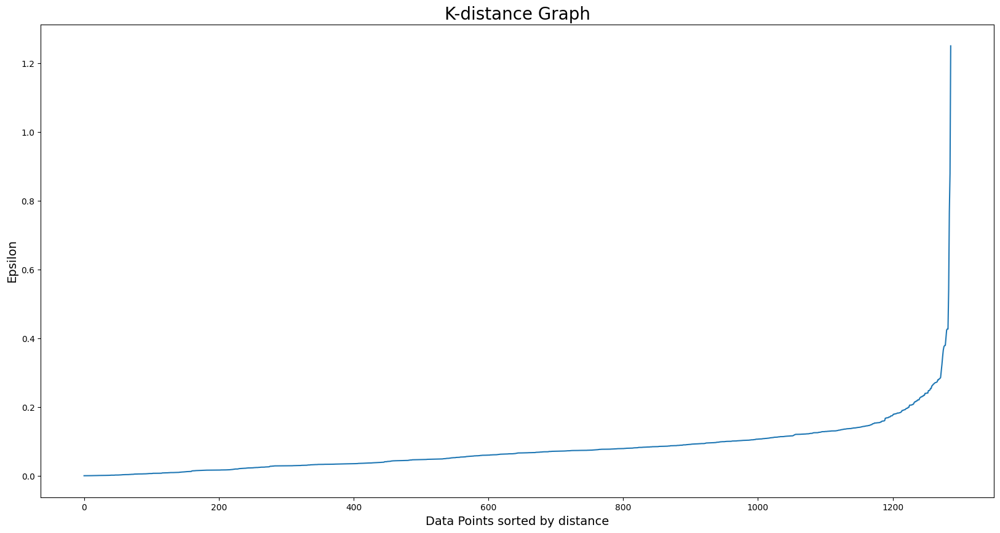

In [12]:
# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

Busqueda de los mejores hiperparametros con ciertas metricas

In [99]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import davies_bouldin_score

# Definir hiperparámetros a variar
eps_options = np.linspace(0.2, 0.3, 10)
min_samples_options = range(2, 6)
algorithm_options = ['auto', 'ball_tree', 'kd_tree', 'brute']

# Crear una lista para almacenar temporalmente los resultados
resultados_list = []

# Iterar sobre todas las combinaciones de hiperparámetros
for eps in eps_options:
    for min_samples in min_samples_options:
        for algorithm in algorithm_options:
            # Crear y ajustar el modelo DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples, algorithm=algorithm)
            dbscan.fit(datos_normalizados)
            
            # Calcular el coeficiente de silueta
            silhouette_avg = silhouette_score(datos_normalizados, dbscan.labels_)
            davies = davies_bouldin_score(datos_normalizados, dbscan.labels_)

            
            # Guardar los resultados en la lista
            resultados_list.append({'Eps': eps,
                                     'Min_Samples': min_samples,
                                     'Algorithm': algorithm,
                                     'Silhouette_Score': silhouette_avg,
                                     'davies_bouldin_score':davies})

# Convertir la lista de resultados en un DataFrame
resultados_df = pd.DataFrame(resultados_list)


In [104]:
resultados_df.sort_values(by='Silhouette_Score',ascending=False)


,Eps,Min_Samples,Algorithm,Silhouette_Score,davies_bouldin_score
149,0.300000,3,ball_tree,0.642179,1.272243
148,0.300000,3,auto,0.642179,1.272243
150,0.300000,3,kd_tree,0.642179,1.272243
151,0.300000,3,brute,0.642179,1.272243
152,0.300000,4,auto,0.625126,1.278505
...,...,...,...,...,...
1,0.200000,2,ball_tree,0.297698,1.613676
16,0.211111,2,auto,0.281739,2.027583
17,0.211111,2,ball_tree,0.281739,2.027583
19,0.211111,2,brute,0.281739,2.027583


In [102]:
resultados_df.sort_values(by='davies_bouldin_score',ascending=True)

,Eps,Min_Samples,Algorithm,Silhouette_Score,davies_bouldin_score
115,0.277778,2,brute,0.527074,1.197463
114,0.277778,2,kd_tree,0.527074,1.197463
113,0.277778,2,ball_tree,0.527074,1.197463
112,0.277778,2,auto,0.527074,1.197463
147,0.300000,2,brute,0.596335,1.205918
...,...,...,...,...,...
10,0.200000,4,kd_tree,0.385257,1.742229
19,0.211111,2,brute,0.281739,2.027583
18,0.211111,2,kd_tree,0.281739,2.027583
17,0.211111,2,ball_tree,0.281739,2.027583


Grafica de como va cambiando la score del coeficiente de la silueta

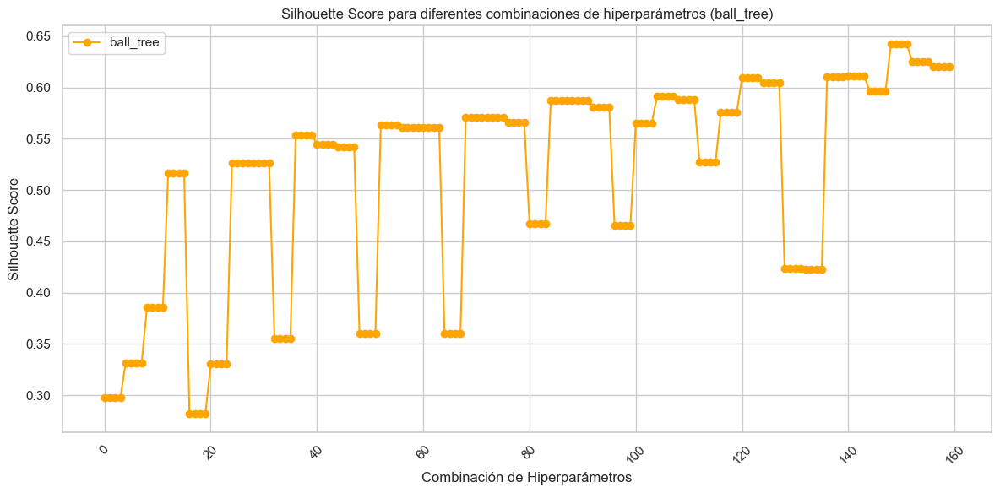

In [92]:
plt.figure(figsize=(12, 6))
plt.plot(range(len(resultados_df)), resultados_df['Silhouette_Score'], marker='o', color='orange', label='ball_tree')

# Ajustar etiquetas y título
plt.title('Silhouette Score para diferentes combinaciones de hiperparámetros (ball_tree)')
plt.xlabel('Combinación de Hiperparámetros')
plt.ylabel('Silhouette Score')
plt.legend()

# Rotar las etiquetas del eje x para mejorar la legibilidad
plt.xticks(rotation=45)

plt.grid(True)
plt.tight_layout()
plt.show()

Nos quedamos con el que mejor resultados nos dio

In [93]:


dbscan = DBSCAN(eps=0.3, min_samples=3,algorithm='ball_tree')
dbscan.fit(datos_normalizados)


DBSCAN(algorithm='ball_tree', eps=0.3, min_samples=3)

In [94]:
# se agregan las etiquetas del clustering al df original
gdf['Cluster'] = dbscan.labels_

# distribución de los clusters
print(gdf['Cluster'].value_counts())


Cluster
 0    1270
-1      17
Name: count, dtype: int64


In [95]:
from sklearn import metrics
metrics.silhouette_score(datos_normalizados, gdf['Cluster'])

0.6421793362828595

In [96]:
from sklearn.metrics import davies_bouldin_score
davies_bouldin_score(datos_normalizados, gdf['Cluster'])

1.2722432927899756

In [97]:
import matplotlib.pyplot as plt

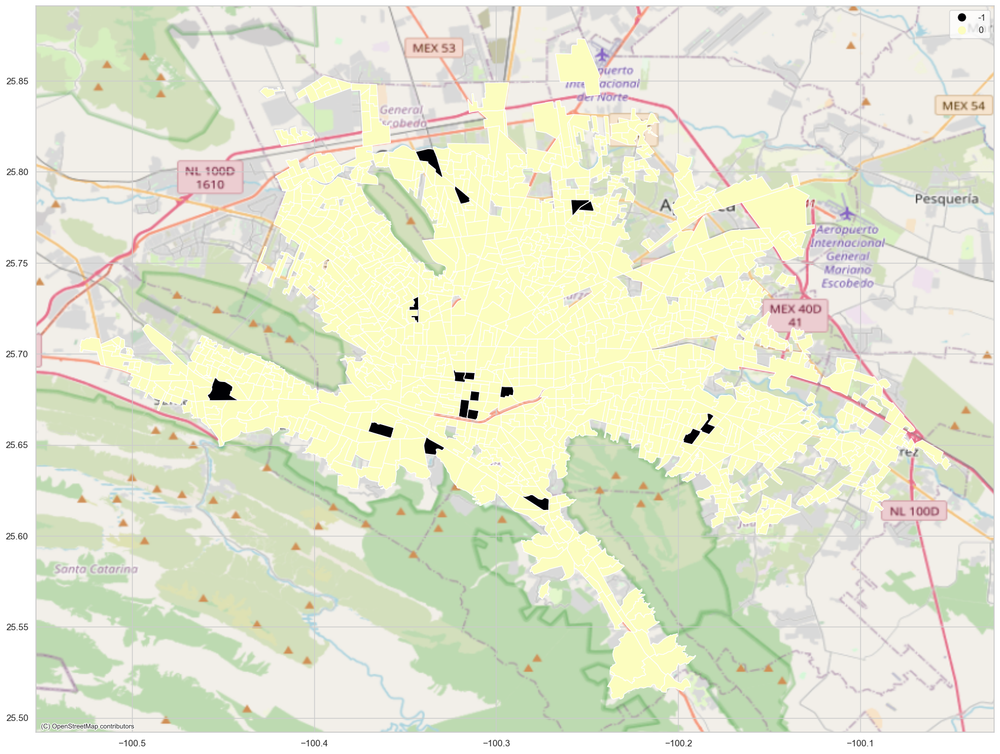

In [98]:
#mostrar clusters en el mapa
ax = gdf.plot("Cluster", cmap="magma", legend=True, figsize=(28, 16), categorical =True)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

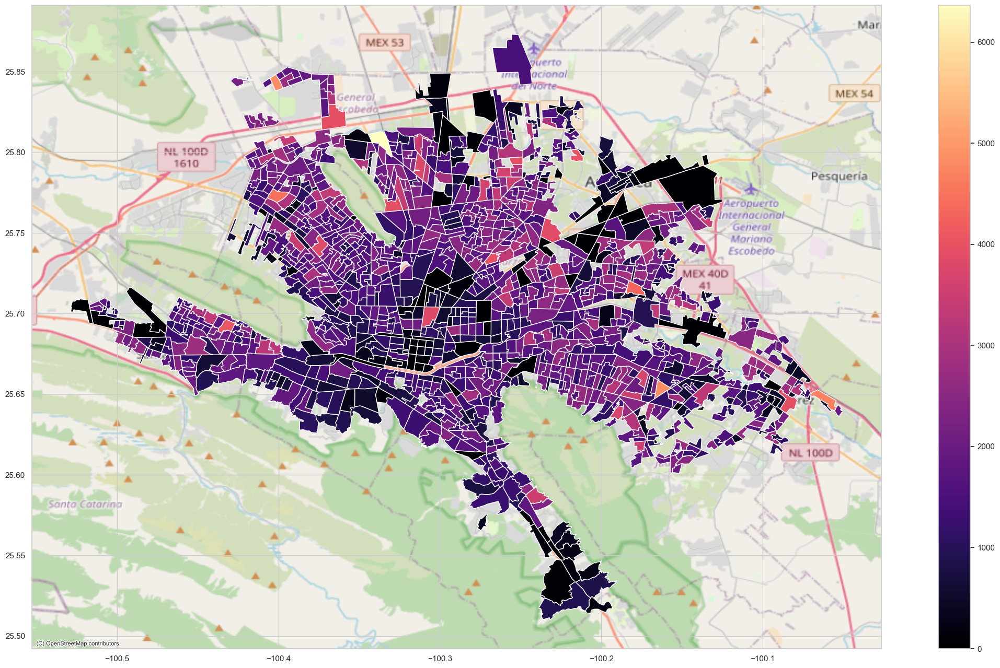

In [105]:
#mostrar clusters en el mapa
ax = gdf.plot("VIVPAR_HAB", cmap="magma", legend=True, figsize=(28, 16))
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

In [40]:
gdf.columns

Index(['CVEMA', 'MUN', 'NOM_MUN', 'AGEB', 'P12A14NOA', 'P15YM_AN', 'P18YM_PB',
       'P6A11_NOAM', 'POBTOT', 'PSINDER', 'VIVPAR_HAB', 'VPH_EXCSA',
       'VPH_LAVAD', 'VPH_NDEAED', 'VPH_PISOTI', 'VPH_REFRI', 'VPH_TELEF',
       'Rest_Carta', 'Rest_Antojitos', 'Rest_Mariscos', 'Rest_Rapida',
       'Rest_TacosTortas', 'Rest_Autoserv', 'Rest_OtrosLlevar', 'geometry',
       'Cluster'],
      dtype='object')

# CALCULANDO POBLACIÓN POR RESTAURANTE

In [106]:
total_restaurantes = ['Rest_Carta',
                       'Rest_Antojitos',
                       'Rest_Mariscos',
                       'Rest_Rapida',
                       'Rest_TacosTortas',
                       'Rest_Autoserv',
                       'Rest_OtrosLlevar',
                       ]

gdf['Tot_Rest'] = gdf[total_restaurantes].sum(axis=1)

## Relación Personas por Restaurante

In [107]:
gdf['POBREST'] = gdf['POBTOT'] / gdf['Tot_Rest'] 
gdf.head()

,CVEMA,MUN,NOM_MUN,AGEB,P12A14NOA,P15YM_AN,P18YM_PB,P6A11_NOAM,POBTOT,PSINDER,...,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar,geometry,Cluster,Tot_Rest,POBREST
0,0061882,6,Apodaca,1882,10,67,3404,0,10712,2186,...,2,0,3,3,1,3,"POLYGON ((-100.15091 25.71505, -100.15099 25.7...",0,12,892.666667
1,0061435,6,Apodaca,1435,5,16,4582,4,9224,1185,...,0,0,1,1,3,0,"POLYGON ((-100.16946 25.75323, -100.16861 25.7...",0,5,1844.800000
2,0061647,6,Apodaca,1647,3,6,2822,0,4650,638,...,0,0,2,1,0,0,"POLYGON ((-100.23345 25.77729, -100.23349 25.7...",0,3,1550.000000
3,0060969,6,Apodaca,0969,0,0,0,0,0,0,...,2,1,3,3,6,0,"POLYGON ((-100.18562 25.77552, -100.18542 25.7...",0,23,0.000000
4,006030A,6,Apodaca,030A,10,15,2860,7,8268,1230,...,1,0,1,0,0,0,"POLYGON ((-100.16562 25.73954, -100.16554 25.7...",0,2,4134.000000


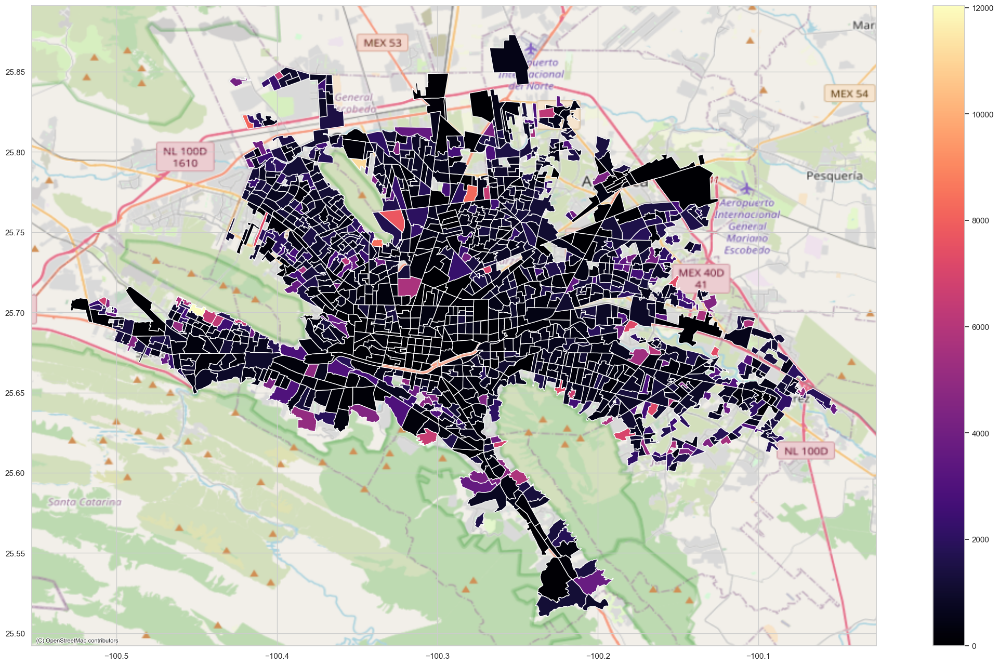

In [108]:
#mostrar Personas por restaurante
ax = gdf.plot("POBREST", cmap="magma", legend=True, figsize=(28, 16))
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

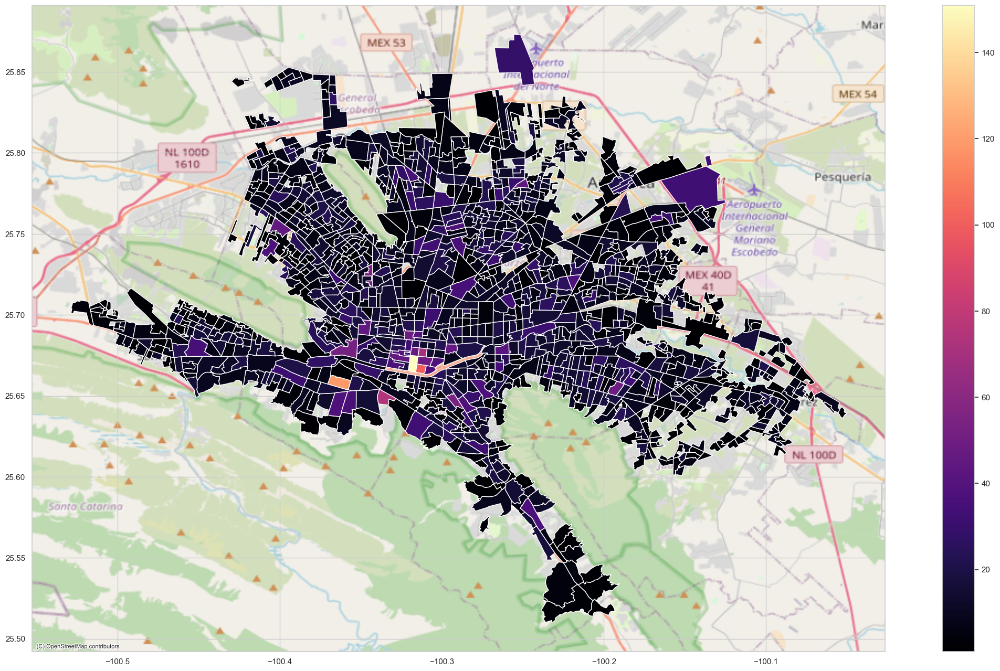

In [109]:
#mostrar Total de restaurante
ax = gdf.plot("Tot_Rest", cmap="magma", legend=True, figsize=(28, 16))
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

In [110]:
gdf[['Tot_Rest','POBREST','POBTOT']].describe()

,Tot_Rest,POBREST,POBTOT
count,1287.000000,1287.000000,1287.000000
mean,10.599068,1169.735322,5900.272727
std,10.603233,1395.272537,3241.195867
min,1.000000,0.000000,0.000000
25%,4.000000,364.357143,3731.000000
50%,8.000000,691.200000,5808.000000
75%,14.000000,1373.321429,7866.000000
max,151.000000,12038.000000,22586.000000


## OUTLIERS 

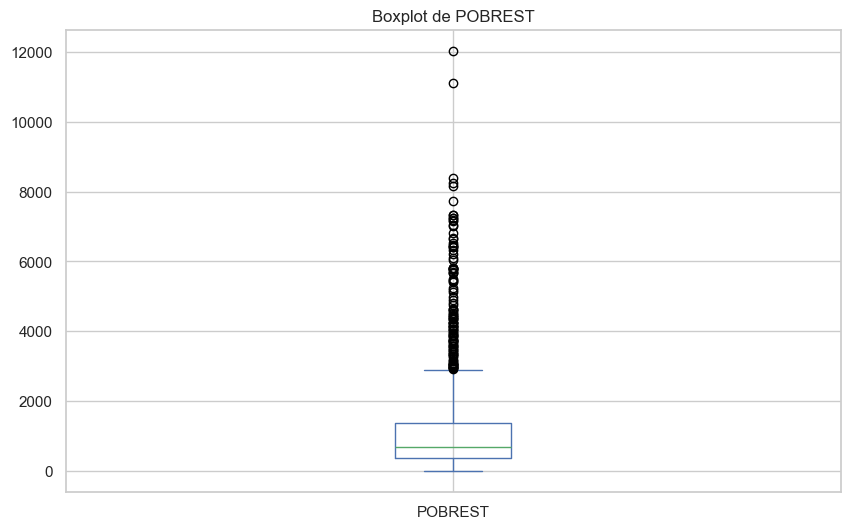

In [111]:
plt.figure(figsize=(10, 6))
gdf['POBREST'].plot(kind='box')
plt.title(f"Boxplot de {'POBREST'}")
plt.show()

A partir de este boxblot nos damos cuenta de que existen outliers que generan mucho ruido, por lo tanto nos quedaremos unicamente con el rango del 25% al 75%

In [112]:
# Calcular la media y la desviación estándar de la columna
mean = gdf['POBREST'].mean()
std_dev = gdf['POBREST'].std()

# Definir un límite (por ejemplo, 3 desviaciones estándar)
cut_off = std_dev * 3
lower, upper = mean - cut_off, mean + cut_off

# Eliminar outliers
gdf_sin_outliers = gdf[(gdf['POBREST'] > 364.357143) & (gdf['POBREST'] < 1373.321429)]

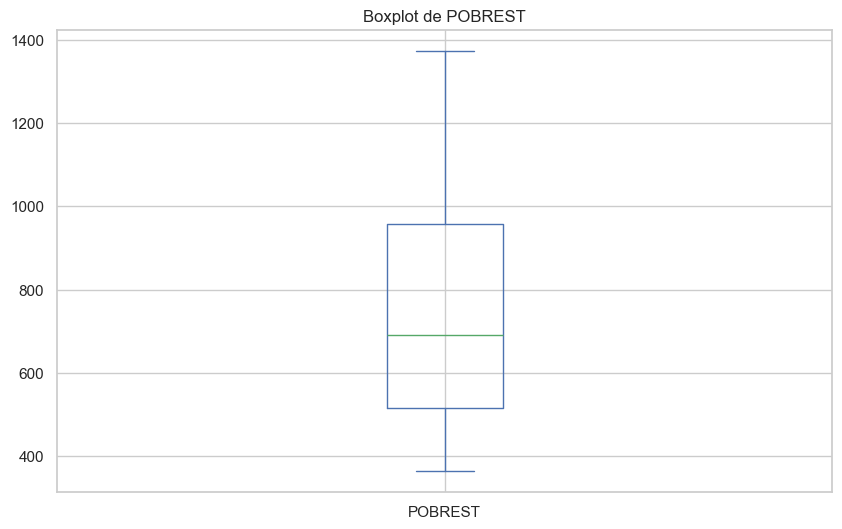

In [113]:
plt.figure(figsize=(10, 6))
gdf_sin_outliers['POBREST'].plot(kind='box')
plt.title(f"Boxplot de {'POBREST'}")
plt.show()

C:\Users\gael1\AppData\Local\Temp\ipykernel_10484\2737016064.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=gdf, x='Cluster', y='POBREST', palette='magma')


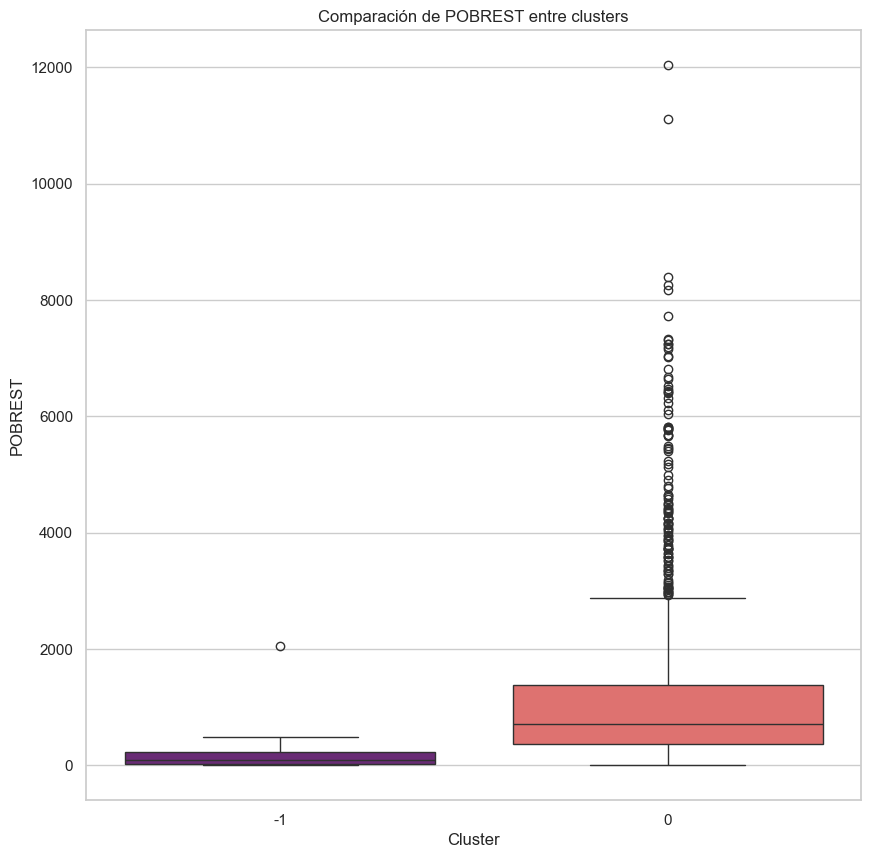

In [114]:
# Visualización de boxplots comparativos de POBREST entre clusters
plt.figure(figsize=(10, 10))
sns.boxplot(data=gdf, x='Cluster', y='POBREST', palette='magma')
plt.title('Comparación de POBREST entre clusters')
plt.xlabel('Cluster')
plt.ylabel('POBREST')
plt.show()

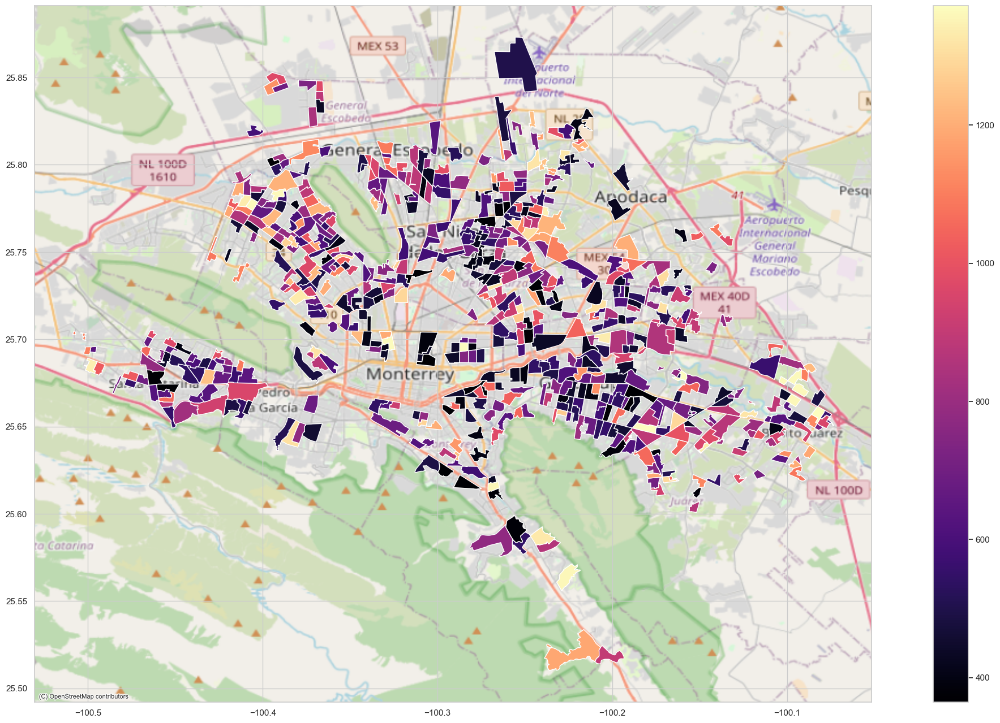

In [115]:
#mostrar Relación Pob Rest eliminando los outliers
ax = gdf_sin_outliers.plot("POBREST", cmap="magma", legend=True, figsize=(28, 16))
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

In [116]:
#conteo de clusters después de filtrar 
gdf_sin_outliers['Cluster'].value_counts()

Cluster
 0    642
-1      1
Name: count, dtype: int64

In [117]:
# se seleccionan las columnas numéricas relevantes para el clustering 
columnas_numericas = gdf.select_dtypes(include=np.number).columns.tolist()
columnas_numericas.remove('Cluster')

# se calcula el promedio de cada variable numérica para cada cluster
medias_por_cluster = gdf.groupby('Cluster')[columnas_numericas].mean()

# solo las columnas de restaurantes
columnas_restaurantes = ['Rest_Carta',
                       'Rest_Antojitos',
                       'Rest_Mariscos',
                       'Rest_Rapida',
                       'Rest_TacosTortas',
                       'Rest_Autoserv',
                       'Rest_OtrosLlevar',
                       ]
medias_restaurantes_por_cluster = medias_por_cluster[columnas_restaurantes]

# Muestra las medias de frecuencia de restaurantes por cluster
medias_restaurantes_por_cluster

,Rest_Carta,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar
Cluster,,,,,,,
-1,15.882353,5.294118,3.705882,5.000000,17.176471,5.823529,4.294118
0,1.520472,1.438583,0.396063,1.944094,3.681890,0.470866,0.523622


In [118]:
medias_restaurantes_por_cluster.reset_index(inplace=True)
medias_restaurantes_melted = pd.melt(medias_restaurantes_por_cluster, id_vars=['Cluster'], var_name='Tipo de Restaurante', value_name='Frecuencia')

In [119]:
medias_restaurantes_melted

,Cluster,Tipo de Restaurante,Frecuencia
0,-1,Rest_Carta,15.882353
1,0,Rest_Carta,1.520472
2,-1,Rest_Antojitos,5.294118
3,0,Rest_Antojitos,1.438583
4,-1,Rest_Mariscos,3.705882
5,0,Rest_Mariscos,0.396063
6,-1,Rest_Rapida,5.000000
7,0,Rest_Rapida,1.944094
8,-1,Rest_TacosTortas,17.176471
9,0,Rest_TacosTortas,3.681890


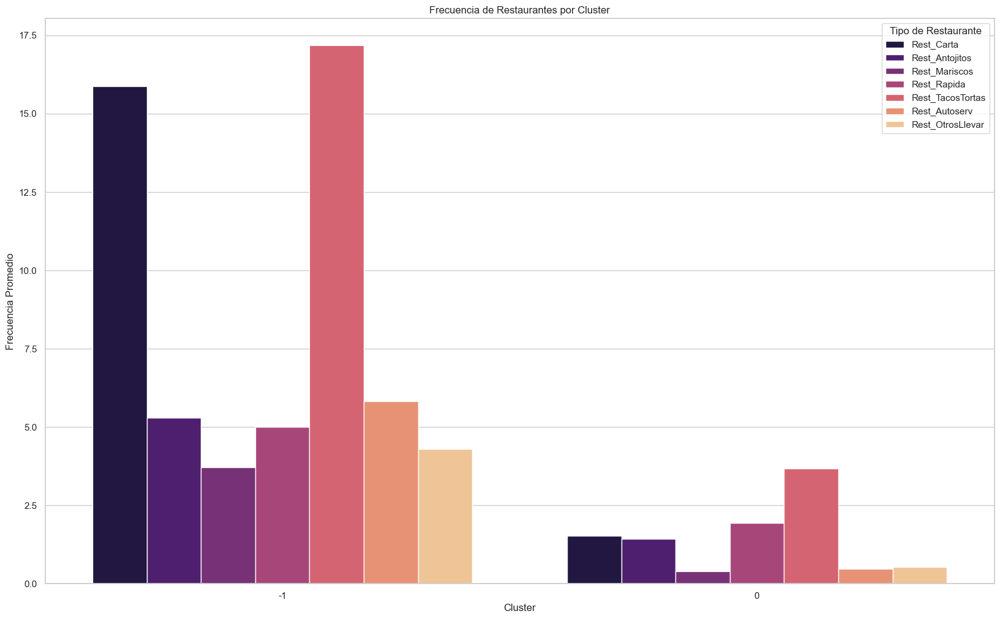

In [120]:
# Configuración de estilo de Seaborn
sns.set(style="whitegrid")

# Gráfico de barras para las medias de frecuencia de restaurantes por cluster
plt.figure(figsize=(20, 12))
sns.barplot(data=medias_restaurantes_melted, 
            x='Cluster', y='Frecuencia', hue='Tipo de Restaurante', palette='magma')

plt.title('Frecuencia de Restaurantes por Cluster')
plt.xlabel('Cluster')
plt.ylabel('Frecuencia Promedio')
plt.legend(title='Tipo de Restaurante')
plt.xticks(rotation=0)  # Rotar etiquetas del eje x
plt.show()

In [60]:
gdf_sin_outliers = gdf[(gdf['POBREST'] < 5000)]

C:\Users\gael1\AppData\Local\Temp\ipykernel_10484\1662435205.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=gdf_sin_outliers, x='Cluster', y='POBREST', palette='magma')


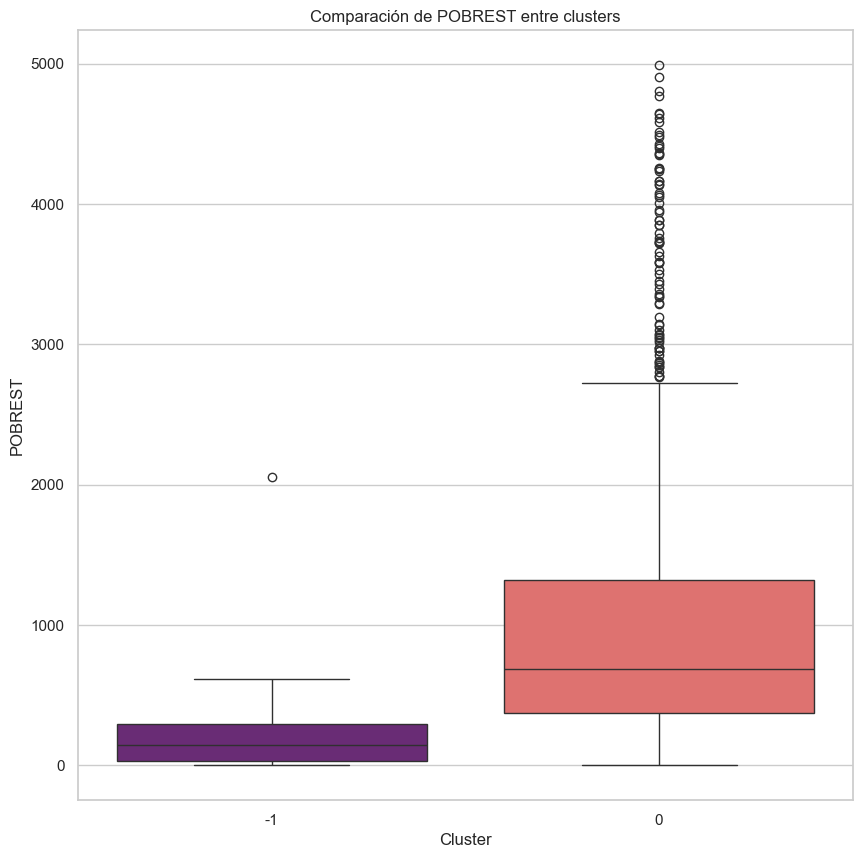

In [61]:
 #Visualización de boxplots comparativos de POBREST entre clusters
plt.figure(figsize=(10, 10))
sns.boxplot(data=gdf_sin_outliers, x='Cluster', y='POBREST', palette='magma')
plt.title('Comparación de POBREST entre clusters')
plt.xlabel('Cluster')
plt.ylabel('POBREST')
plt.show()

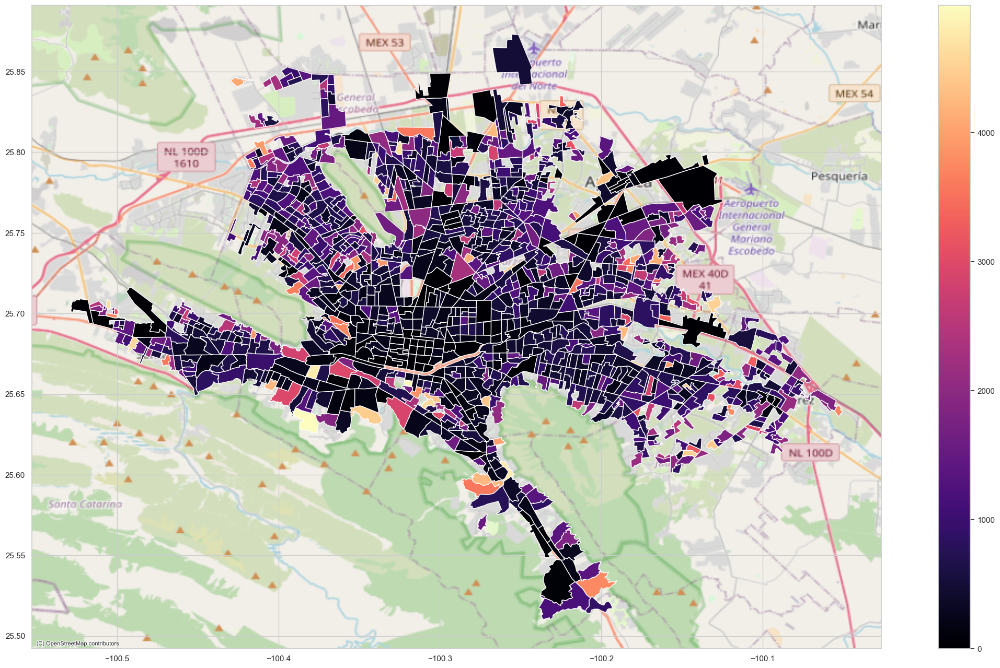

In [62]:
#mostrar Relación Pob Rest eliminando los outliers
ax = gdf_sin_outliers.plot("POBREST", cmap="magma", legend=True, figsize=(28, 16))
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

In [63]:
gdf_sin_outliers['Cluster'].value_counts()

Cluster
 0    1204
-1      41
Name: count, dtype: int64

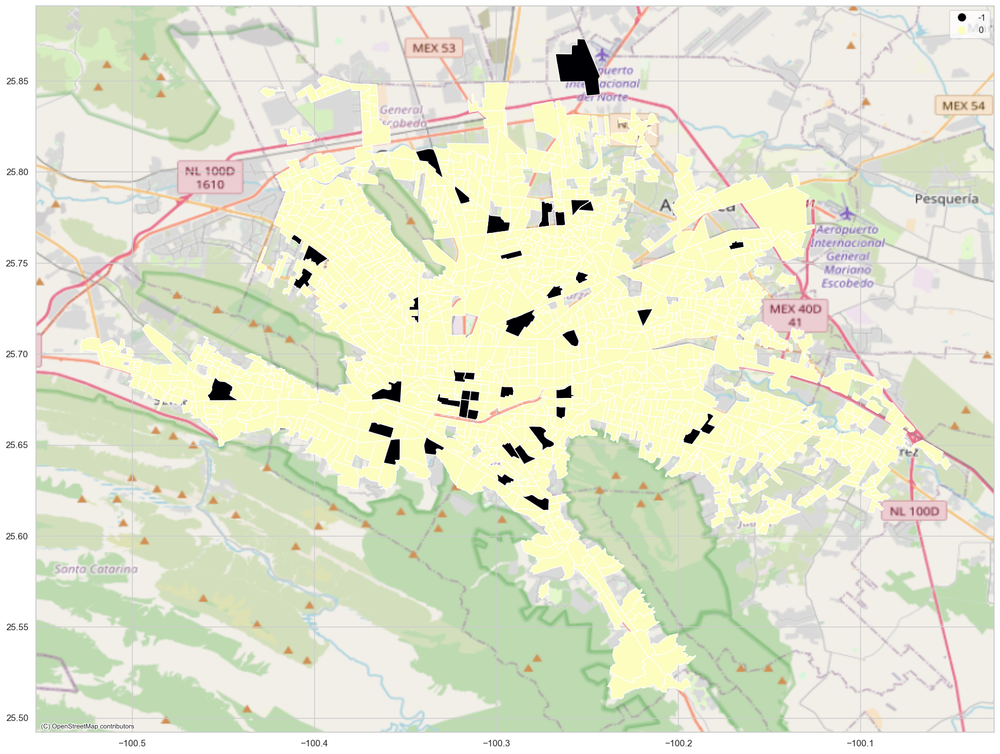

In [64]:
#mostrar Clusters eliminando los outliers
ax = gdf_sin_outliers.plot("Cluster", cmap="magma", legend=True, figsize=(28, 16), categorical = True)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)